In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams.update({'figure.figsize':(20,10), 'figure.dpi':120})

from sklearn.metrics import root_mean_squared_error,mean_absolute_percentage_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

from src.ETL import *
from src.backtesting_forecasting import *

ROOT_PATH = 'data'

## Target series analysis

Index(['HPI', 'HPI real', 'HPI growth1 real', 'HPI growth1 real lag 1',
       'HPI growth1 real lag 2', 'HPI growth1 real lag 3',
       'HPI growth1 real lag 4', 'HPI growth1 real lag 5',
       'HPI growth1 real lag 6', 'HPI growth1 real lag 7'],
      dtype='object')


<Axes: xlabel='Date'>

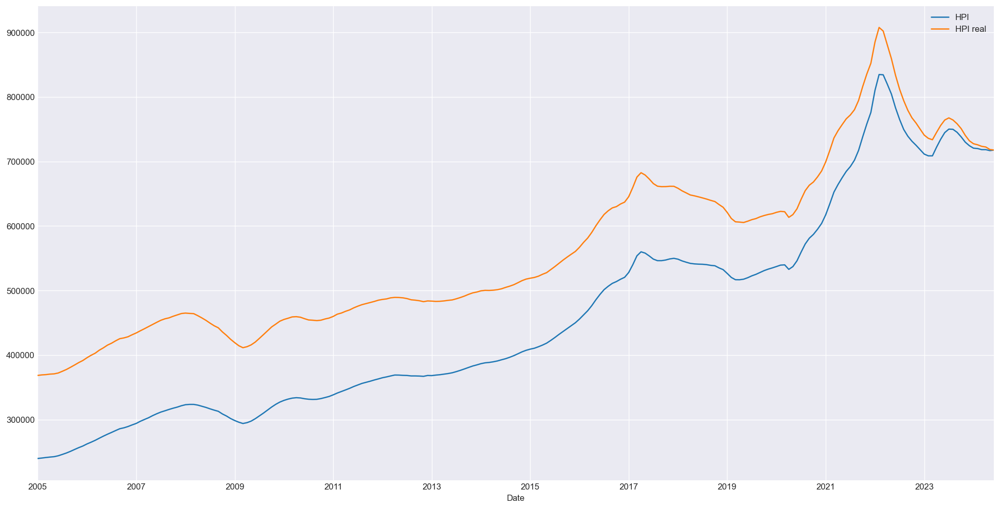

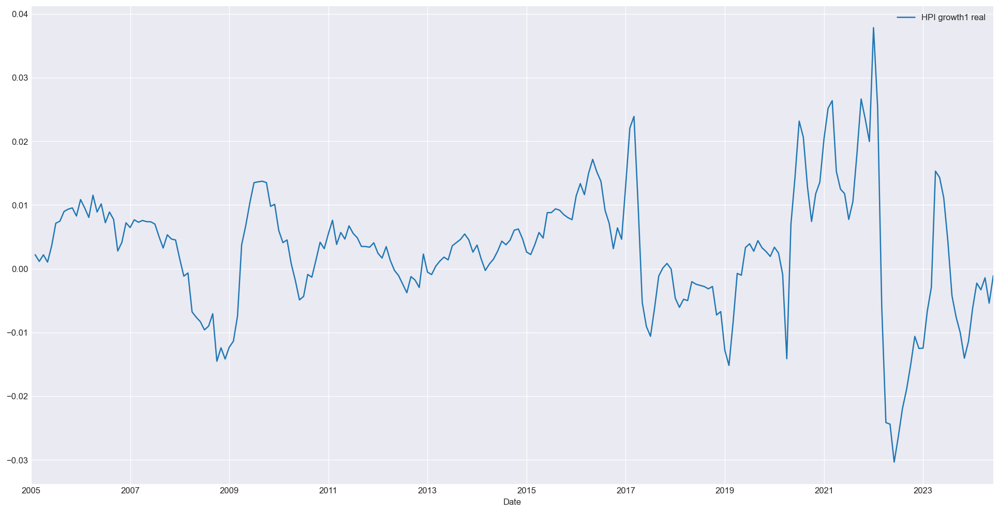

In [2]:
cpi = etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/1810025601_databaseLoadingData.csv', 
                    in_col = "Alternative measures",
                    out_cols = ["Measure of core inflation based on a weighted median approach, CPI-median (index, 198901=100)"],
                    new_names = ['CPI'],
                    num_lags = 1)

df = etl_pipeline(extract_data_from_CREA, file_path = f'{ROOT_PATH}/MLS_HPI/Seasonally Adjusted_June_2024.xlsx', sheet_name = 'AGGREGATE',
                in_col = "Composite_Benchmark_SA", new_names = ["HPI"],
                num_lags = 7, lagged_cols = ['HPI growth1 real'],
                transform_dict = {"HPI": [infl_adjusted(cpi), compose(growth(1), infl_adjusted(cpi))]})


print(df.columns)

target = "HPI growth1 real" 
# df = df[target].dropna()
# df.plot()
df[['HPI','HPI real']].plot()
plt.figure()
df[target].plot(legend="top")

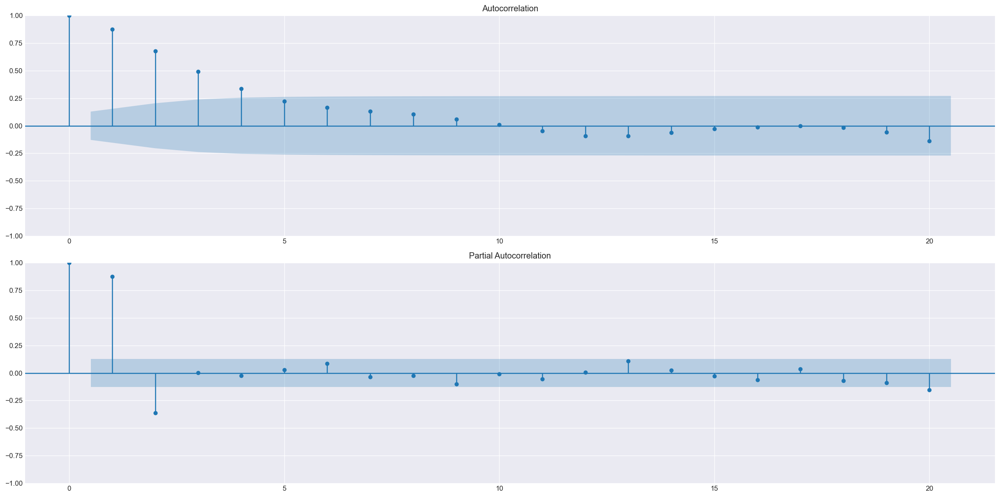

In [3]:
f, ax = plt.subplots(nrows=2, ncols=1)
plot_acf(df[target].dropna(),lags=20, ax=ax[0])
plot_pacf(df[target].dropna(),lags=20, ax=ax[1])
plt.tight_layout()
plt.show()

## Covariates engineering

In [4]:

df_cov = df.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/1410028701_databaseLoadingData.csv',
                            in_col = "Labour force characteristics", 
                            out_cols = ["Participation rate", "Employment rate", "Unemployment rate","Population", "Labour force",]
                            ))

df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/3410014501_databaseLoadingData.csv', in_col = None, out_cols = ["Mortgage rate 5y"],
                         transform_dict = {"Mortgage rate 5y": [diff(1), diff(12), growth(1), growth(12),rolling_mean(3),compose(growth(12),rolling_mean(3)),
                                                                compose(growth(1),rolling_mean(3))]
                                          }))

df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/1810020501_databaseLoadingData.csv', 
                                     in_col = "New housing price indexes",
                                     out_cols = ["Total (house and land)"],
                                     new_names = ["NHPI"],
                                     transform_dict = {"NHPI": compose(growth(1), infl_adjusted(cpi)) }))


df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/1010011601_databaseLoadingData.csv', 
                                     in_col = "Assets, liabilities and monetary aggregates",
                                     out_cols = ["M2 (gross) (currency outside banks, chartered bank demand and notice deposits, chartered bank personal term deposits, adjustments to M2 (gross) (continuity adjustments and inter-bank demand and notice deposits))",
                                      "M2++ (gross) (M2+ (gross), Canada Savings Bonds, non-money market mutual funds)"],
                                     new_names = ["M2", "M2++"],
                                     transform_dict = {"M2": [infl_adjusted(cpi), compose(growth(1), infl_adjusted(cpi)),compose(growth(12), infl_adjusted(cpi))],
                                                       "M2++": [compose(growth(12), infl_adjusted(cpi)),
                                                                compose(growth(1), infl_adjusted(cpi)), 
                                                                ]}))
# df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/3410013501_databaseLoadingData.csv', 
#                                      in_col = "Housing estimates",
#                                      out_cols = ["Housing starts","Housing under construction", "Housing completions" ],
#                                      filters = {"Type of unit": "Total units"},
#                                      transform_dict = {"Housing completions": growth(4),
#                                                        "Housing starts": growth(4),
#                                                        "Housing under construction": growth(4)}))

# df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/3610011201_databaseLoadingData.csv', 
#                                     in_col = "Estimates",
#                                     out_cols = ["Equals: household disposable income","Compensation of employees", "Household saving rate"],
#                                     new_names = ["Disposable income","Compensation", "Household saving rate"],
#                                     transform_dict = {"Disposable income": compose(growth(1), infl_adjusted(cpi)),
#                                                       "Compensation": compose(growth(1), infl_adjusted(cpi)),
#                                                       "Household saving rate": rolling_mean(3)}))

# df_cov = df_cov.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/3610049101_databaseLoadingData.csv', 
#                                       in_col = "North American Industry Classification System (NAICS)",
#                                       out_cols = ["All industries [T001]"], 
#                                       new_names = ["GDP"],
#                                       filters = {"Release": "May 31, 2024"},
#                                       transform_dict = {"GDP": growth(12)}))

df_cov = df_cov.join(etl_pipeline(extract_data_from_CREA, file_path = f'{ROOT_PATH}/News_release_chart_data_May_2024.xlsx', sheet_name="Chart A",
                      in_col = ["Canada"],
                      new_names = ["Sales"],))

df_cov = df_cov.ffill().bfill()
df_cov = df_cov[sorted(df_cov.columns)]

# df_cov

corr_lag = df_cov.corr()[target][df_cov.corr()[target].abs()>0.3].sort_values()
df_cov.corr()

/Users/andreypak/Downloads/Canada HPI forecasting/src/ETL.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{col} lag {lag}"] = df[col].shift(lag)
/Users/andreypak/Downloads/Canada HPI forecasting/src/ETL.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{col} lag {lag}"] = df[col].shift(lag)
/Users/andreypak/Downloads/Canada HPI forecasting/src/ETL.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joi

,Employment rate,Employment rate lag 1,Employment rate lag 10,Employment rate lag 11,Employment rate lag 12,Employment rate lag 13,Employment rate lag 14,Employment rate lag 15,Employment rate lag 16,Employment rate lag 17,...,Unemployment rate lag 17,Unemployment rate lag 18,Unemployment rate lag 2,Unemployment rate lag 3,Unemployment rate lag 4,Unemployment rate lag 5,Unemployment rate lag 6,Unemployment rate lag 7,Unemployment rate lag 8,Unemployment rate lag 9
Employment rate,1.000000,0.903674,0.388130,0.356258,0.345211,0.328780,0.296465,0.265792,0.236868,0.211417,...,0.113681,0.141293,-0.447057,-0.351931,-0.285679,-0.236745,-0.199334,-0.172753,-0.155631,-0.129207
Employment rate lag 1,0.903674,1.000000,0.428026,0.390074,0.358694,0.347604,0.330754,0.298251,0.267266,0.238623,...,0.080221,0.112929,-0.589121,-0.448444,-0.353973,-0.288431,-0.238489,-0.200436,-0.174778,-0.157552
Employment rate lag 10,0.388130,0.428026,1.000000,0.906403,0.758298,0.658649,0.592382,0.543567,0.506005,0.479269,...,-0.174777,-0.156478,-0.162877,-0.196294,-0.239643,-0.287528,-0.337624,-0.410179,-0.516126,-0.644433
Employment rate lag 11,0.356258,0.390074,0.906403,1.000000,0.906779,0.759138,0.659542,0.593264,0.544389,0.506520,...,-0.202022,-0.175036,-0.124001,-0.163610,-0.197510,-0.241067,-0.288396,-0.337628,-0.411285,-0.517187
Employment rate lag 12,0.345211,0.358694,0.758298,0.906779,1.000000,0.907070,0.759708,0.660200,0.593887,0.544729,...,-0.238225,-0.199395,-0.068180,-0.123241,-0.163113,-0.197074,-0.240280,-0.286693,-0.336901,-0.410347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Unemployment rate lag 5,-0.236745,-0.288431,-0.287528,-0.241067,-0.197074,-0.163404,-0.123674,-0.068322,-0.024260,0.003505,...,0.182573,0.140957,0.692952,0.796621,0.923761,1.000000,0.923451,0.794748,0.689422,0.610263
Unemployment rate lag 6,-0.199334,-0.238489,-0.337624,-0.288396,-0.240280,-0.196932,-0.163335,-0.123607,-0.068603,-0.022641,...,0.216611,0.177604,0.614806,0.692214,0.796040,0.923451,1.000000,0.923048,0.794104,0.688352
Unemployment rate lag 7,-0.172753,-0.200436,-0.410179,-0.337628,-0.286693,-0.239146,-0.196085,-0.162592,-0.123318,-0.066404,...,0.267653,0.211126,0.555240,0.613570,0.690891,0.794748,0.923048,1.000000,0.922533,0.793063
Unemployment rate lag 8,-0.155631,-0.174778,-0.516126,-0.411285,-0.336901,-0.286639,-0.239190,-0.196129,-0.163039,-0.121675,...,0.331268,0.262601,0.498386,0.554053,0.612356,0.689422,0.794104,0.922533,1.000000,0.922218


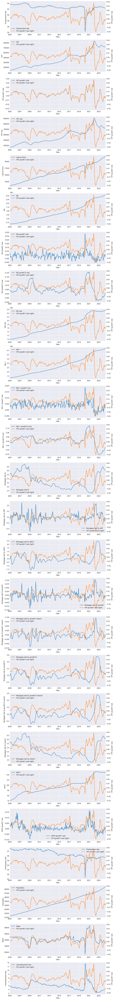

In [6]:
def plot_covariates(df, target, features = None):
    if not features:
        features = [col for col in df.columns if "lag" not in col]
    n_rows = len(features)
    fig, ax = plt.subplots(n_rows, 1, figsize=(10, 4*n_rows))
    for i,feature in enumerate(features):
        df[feature].plot(ylabel=feature, ax=ax[i], legend="left")
        df[target].plot(secondary_y=True, ylabel=target, ax=ax[i], legend="left")
plot_covariates(df_cov, target)
# plot_covariates(df_cov, target, ["Mortgage rate 5y_growth12", "M2++_growth12_real"])

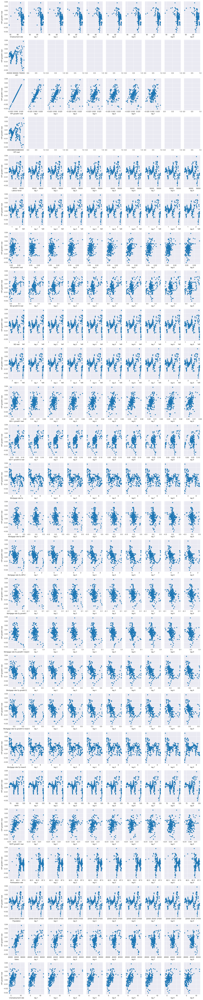

In [8]:
def plot_target_covariates(df, num_lags, target, features = None):
    if not features:
        features = [col for col in df.columns if "lag" not in col]
    n_rows = len(features)
    fig, ax = plt.subplots(n_rows, num_lags, sharey="row", figsize=(20,4*n_rows))
    for i, feature in enumerate(features):
        for j in range(num_lags):
            col_name  = feature if j==0 else feature + " lag " + str(j)
            if col_name in df.columns:
                df.plot.scatter(col_name, target, ax=ax[i][j])
                ax[i][j].set_xlabel(feature if j==0 else "lag " + str(j))
    
plot_target_covariates(df_cov, 10, target)
# plot_target_covariates(df_cov,7,target, ["Mortgage rate 5y_growth12", "M2++_growth1_real"])

In [5]:
pd.set_option('display.max_rows', None)
print(corr_lag)
# print(df_cov.corr()["Mortgage rate 5y_growth12"][df_cov.corr()["Mortgage rate 5y_growth12"].abs()>0.3].sort_values())
pd.reset_option('display.max_rows')

Mortgage rate 5y growth12               -0.487898
Mortgage rate 5y growth12 mean3         -0.487825
Mortgage rate 5y growth12 lag 1         -0.482801
Mortgage rate 5y growth12 mean3 lag 1   -0.472347
Mortgage rate 5y growth12 lag 2         -0.467148
Mortgage rate 5y growth12 mean3 lag 2   -0.450887
Mortgage rate 5y growth12 lag 3         -0.442528
Mortgage rate 5y diff12                 -0.433953
Mortgage rate 5y diff12 lag 1           -0.431601
Mortgage rate 5y growth12 mean3 lag 3   -0.428370
Mortgage rate 5y growth12 lag 4         -0.420439
Mortgage rate 5y diff12 lag 2           -0.420304
Mortgage rate 5y growth12 mean3 lag 4   -0.405783
Mortgage rate 5y growth12 lag 5         -0.401900
Mortgage rate 5y diff12 lag 3           -0.400319
Mortgage rate 5y growth1 mean3 lag 4    -0.390156
Mortgage rate 5y growth1 mean3 lag 5    -0.384907
Mortgage rate 5y growth12 mean3 lag 5   -0.383606
Mortgage rate 5y growth1 mean3 lag 3    -0.381690
Mortgage rate 5y diff12 lag 4           -0.381360


## Forecasting and Backtesting utils

In [6]:
# Custom Moving Average model class
class MovingAverage:
    def __init__(self, y_lags):
        """
        Initialize the MovingAverage model with a specified number of lags.
        
        Parameters:
        - y_lags (int): The number of lags to consider for the moving average.
        """
        self.y_lags = y_lags
    
    def fit(self, X, y):
        """
        Fit method (placeholder) for compatibility with scikit-learn interface.
        
        Parameters:
        - X (array-like): Features (not used in this model).
        - y (array-like): Target variable (not used in this model).
        """
        pass
    
    def predict(self, y):
        """
        Predict the next value based on the moving average of the last y_lags values.
        
        Parameters:
        - y (array-like): Array of values to calculate the moving average from.
        
        Returns:
        - list: A list containing the predicted value.
        """
        return [np.mean(y[0][:self.y_lags])]

# Instantiate the MovingAverage model
MA = MovingAverage(y_lags=1)

def inv_growth(dy, y0):
    """
    Reverts the growth rate to actual values.
    
    Parameters:
    - dy (array-like): The growth rate series.
    - y0 (float): The initial value.
    
    Returns:
    - np.array: The reverted series.
    """
    return np.exp(np.cumsum(dy)) * y0

def maape(A, F):
    return np.mean(np.arctan(np.abs((F - A) / A)))

def calc_metrics(y, y_hat, interval_name):
    """
    Calculate and print various performance metrics for the model.
    
    Parameters:
    - y (array-like): The true values.
    - y_hat (array-like): The predicted values.
    - y_train (array-like): The training target values.
    - interval_name (str): The name of the interval (e.g., 'Train', 'Test').
    """
    print(f"--------------{interval_name}-------------------")
    print(f"RMSE: {root_mean_squared_error(y, y_hat):.3f}", )
    print(f"R^2:  {r2_score(y, y_hat):.2f}", )
    print(f"MAAPE:  {maape(y, y_hat):.2f}", )


def show_results(y, preds, test_split_time, inverse_transform=False):
    """
    Display and compare actual vs predicted values, and calculate performance metrics.
    
    Parameters:
    - y (pd.Series): The true target series.
    - preds (array-like): The predicted values.
    - test_split_time (str or pd.Timestamp): The split time separating train and test periods.
    - inverse_transform (bool): Whether to apply inverse transformations to predictions.
    """
    y_train, y_test = y[:test_split_time], y[test_split_time:]

    if inverse_transform:
        preds = inv_growth(preds, y_train.iloc[0])

    preds = pd.Series(preds, name="Predictions", index=y.index)
    figure = plt.figure()
    y.plot(legend="top")
    preds.plot(legend="top")
    calc_metrics(y_train, preds[:test_split_time], "Train")
    calc_metrics(y_test, preds[test_split_time:],"Test")

def show_backteting(series_args, y, inverse_transform=False):
    
    for series, series_name in series_args:
        rmse_l, maape_l = [] ,[]
        figure = plt.figure()
        y.plot(legend="top")

        for y_hat in series:
            ind = y_hat.index
            if inverse_transform:
                y_hat = inv_growth(y_hat, y[:ind[0]].iloc[-2])
            rmse_l.append(root_mean_squared_error(y[ind], y_hat))
            maape_l.append(maape(y[ind], y_hat))

            y_hat.plot(label=series_name, color = 'red')
        print(f"----------{series_name}---------")
        print(f"avg RMSE: {np.mean(rmse_l):.3f}", )
        print(f"avg MAAPE: {np.mean(maape_l):.2f}", )    

## Linear Regression

coefficients:  -0.00018929067442912837 [-0.28848928  1.08558724 -0.00499553  0.19727559]
--------------Train-------------------
RMSE: 0.003
R^2:  0.79
MAAPE:  0.41
--------------Test-------------------
RMSE: 0.008
R^2:  0.78
MAAPE:  0.40
--------------Train-------------------
RMSE: 8059.279
R^2:  0.99
MAAPE:  0.01
--------------Test-------------------
RMSE: 12670.443
R^2:  0.95
MAAPE:  0.01
----------Backtesting---------
avg RMSE: 0.012
avg MAAPE: 0.53
----------Naive---------
avg RMSE: 0.014
avg MAAPE: 0.60
----------Backtesting---------
avg RMSE: 25001.152
avg MAAPE: 0.02
----------Naive---------
avg RMSE: 28665.986
avg MAAPE: 0.03
                            OLS Regression Results                            
Dep. Variable:       HPI growth1 real   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     185.1
Date:                Sat, 12 Oct 2024   Pr

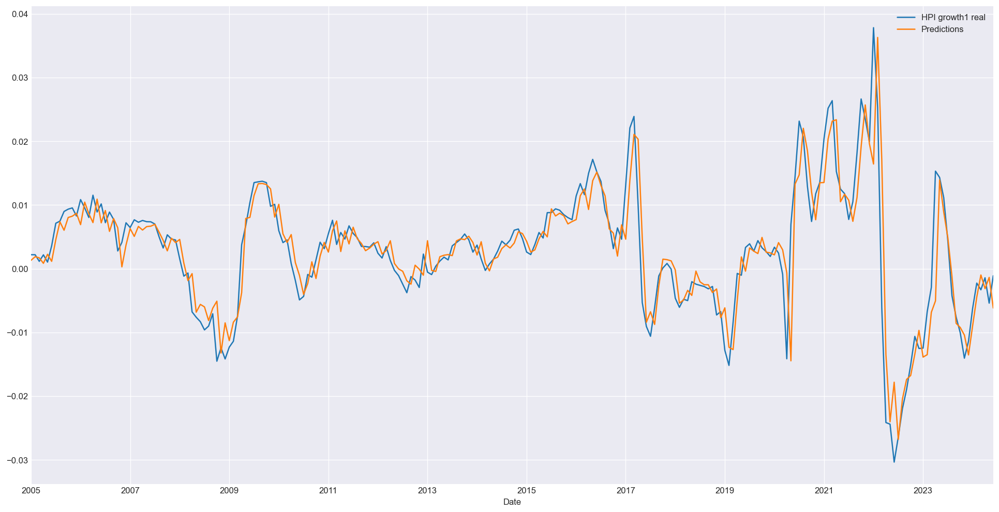

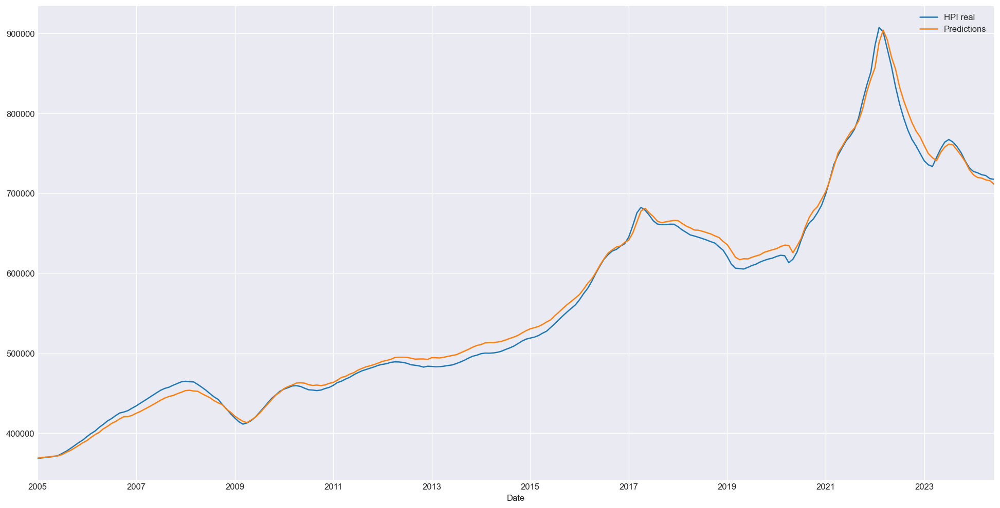

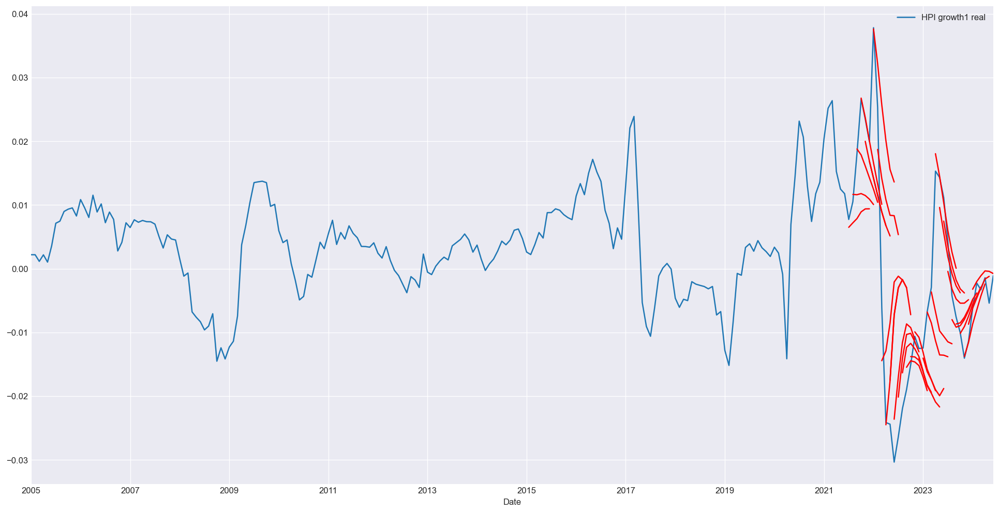

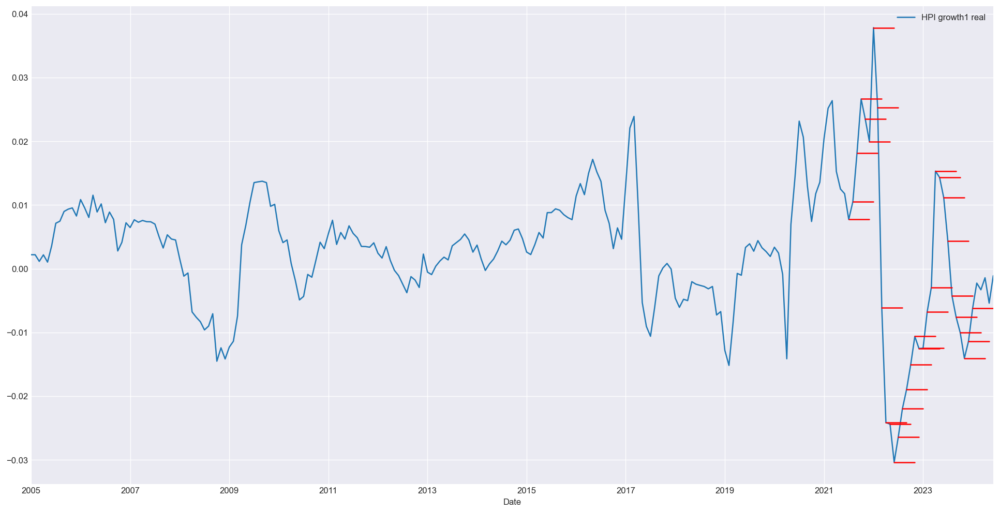

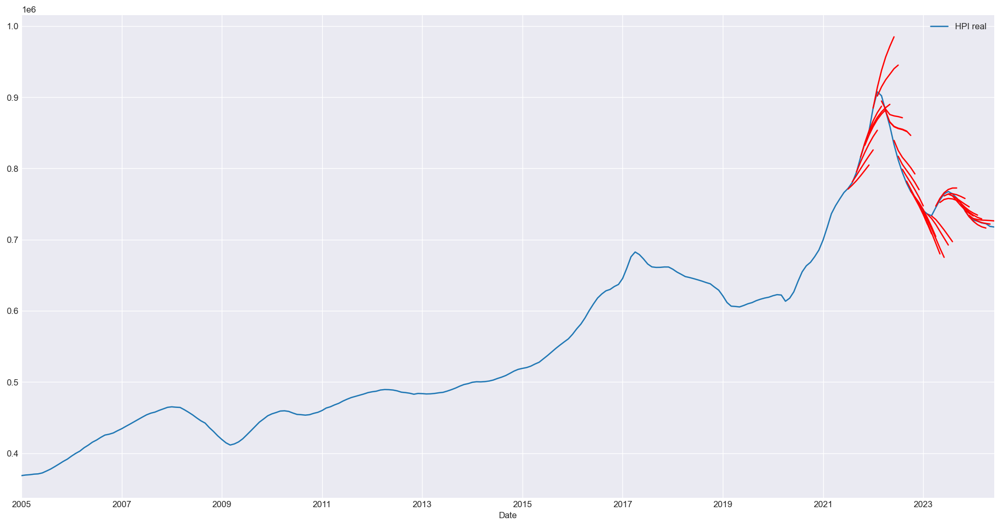

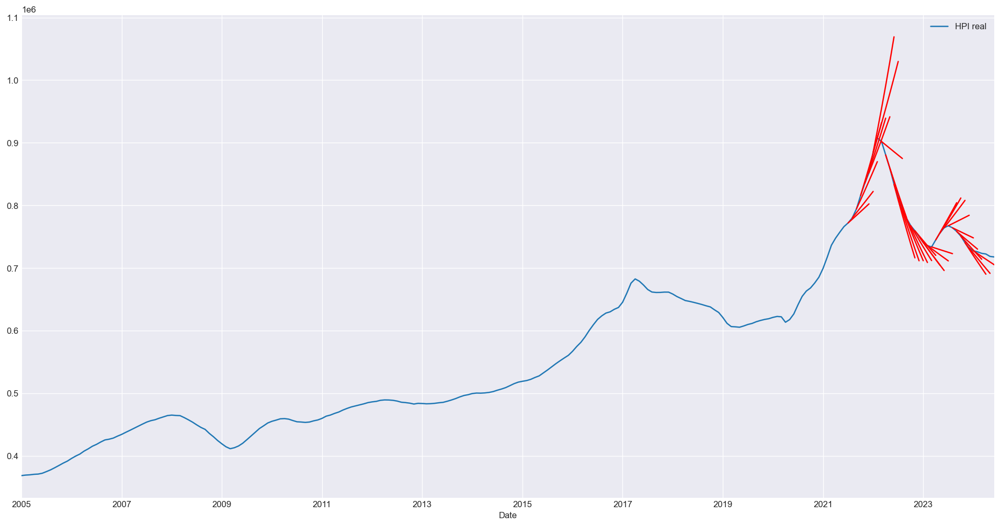

In [7]:
# features = ["M2_growth4_real_lag_2","Mortgage rate 5y_diff1_lag_2","Household saving rate_lag_3"]# 
features = ["Mortgage rate 5y growth12 lag 6", "M2++ growth1 real lag 6"]

y_lags = 2
test_split_time = pd.Timestamp("20210725")

features = [target + " lag " + str(j) for j in range(y_lags, 0,-1)]  + features

X, y = df_cov[features], df_cov[target]
X_train, y_train = X[:test_split_time], y[:test_split_time]

LR = LinearRegression()
# LR = Lasso(0.000005)
LR.fit(X_train, y_train)
print("coefficients: ", LR.intercept_,  LR.coef_)
preds = LR.predict(X)

forecast = backtesting(df_cov, target, features, test_split_time, 6, y_lags, LR, 1, retrain = True)
forecast2 = backtesting(df_cov, target, features, test_split_time, 6, 1, MA, 1, retrain = True)

series_args = [[forecast, "Backtesting"],
               [forecast2, "Naive"],
               ]

show_results(y, preds, test_split_time)
show_results(df["HPI real"], preds, test_split_time, inverse_transform = True)

show_backteting(series_args, y)
show_backteting(series_args, df["HPI real"], inverse_transform=True)

sm_est = sm.OLS(y_train, sm.add_constant(X_train))
sm_est2 = sm_est.fit()
print(sm_est2.summary())

## Residual Analysis

(-14.122421553354016, 2.411847279105234e-26, 0, 233, {'1%': -3.458731141928624, '5%': -2.8740258764297293, '10%': -2.5734243167124093}, -1737.6949169251563)


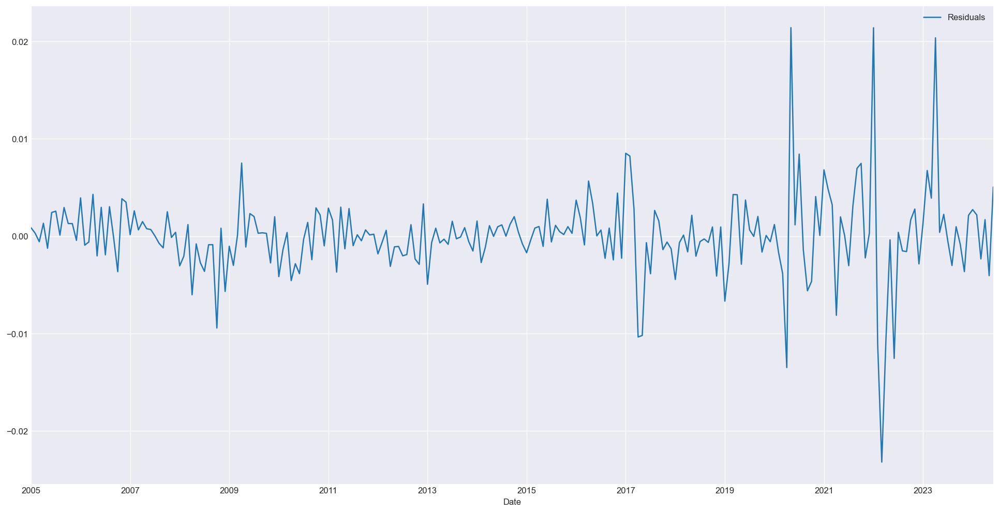

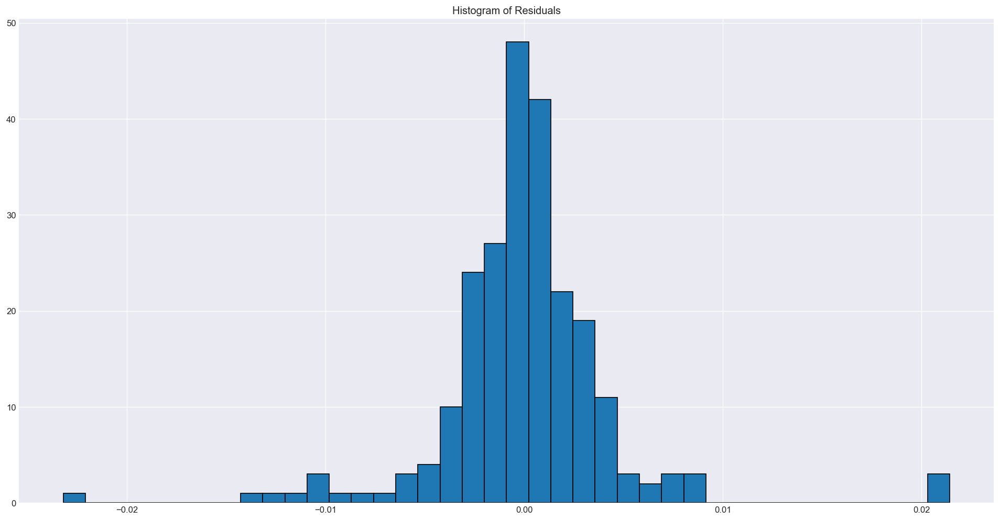

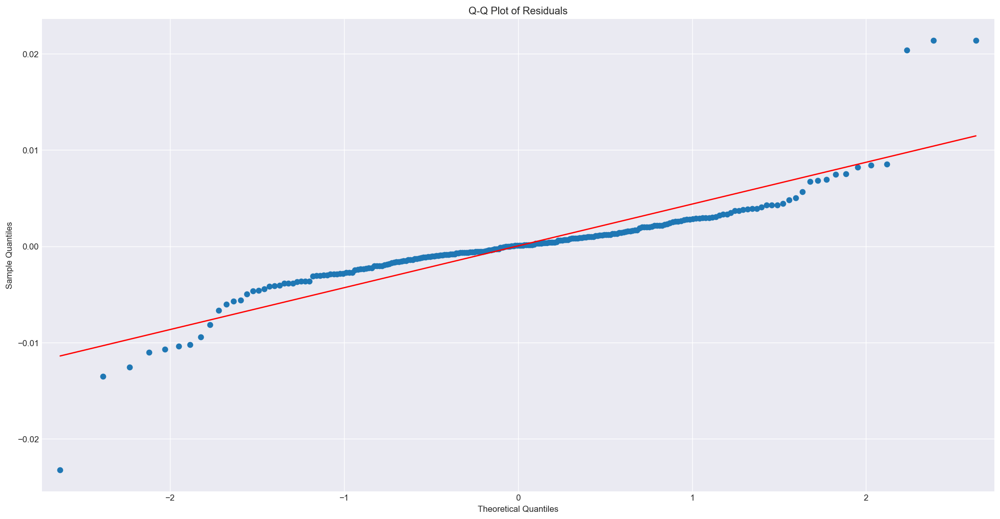

In [8]:
residuals = (df_cov[target].values- preds)
pd.DataFrame(residuals, columns=["Residuals"], index = df_cov.index).plot()

print(adfuller(residuals))
plt.figure()
plt.hist(residuals, bins=40, edgecolor='k')
plt.title('Histogram of Residuals')
plt.show()

sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

## Forecast

In [9]:
def show_forecast(series, pred, inverse_transform=True):
    """
    Display the actual series and forecasted values on a plot.

    Parameters:
    - series (pd.Series): The actual time series data.
    - pred (pd.Series): The forecasted values.
    - inverse_transform (bool): Whether to apply inverse transformations to predictions.

    Returns:
    - None
    """
    if inverse_transform:
        pred = inv_growth(pred, series.iloc[-1])

    plt.figure()
    pred.plot(legend="top", label="Forecast")
    series.plot(legend="top", label="Actual")

    print(pred)


2024-07-31    716863.900807
2024-08-31    716037.326303
2024-09-30    715297.818543
2024-10-31    714666.821631
2024-11-30    714208.188511
2024-12-31    713901.352565
Freq: ME, Name: Forecast, dtype: float64
2024-07-31   -0.001166
2024-08-31   -0.001154
2024-09-30   -0.001033
2024-10-31   -0.000883
2024-11-30   -0.000642
2024-12-31   -0.000430
Freq: ME, Name: Forecast, dtype: float64


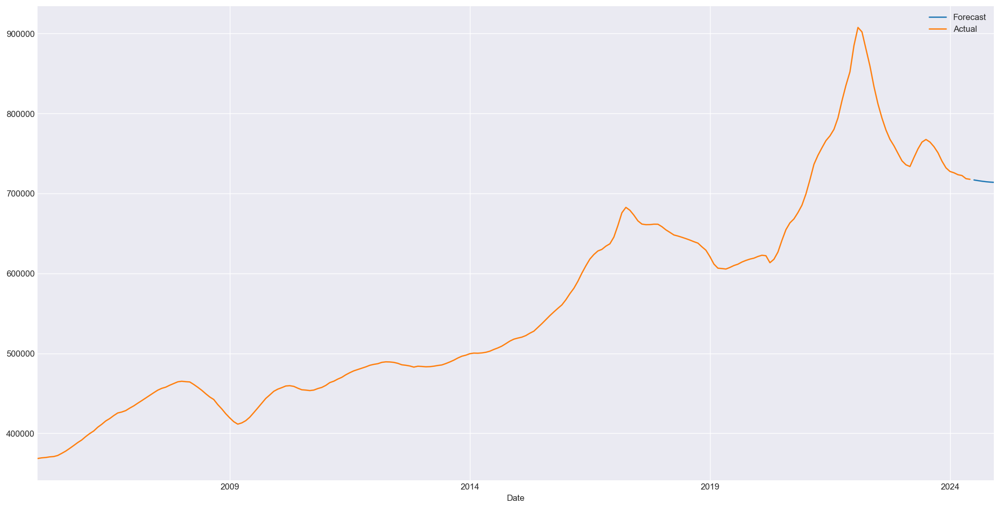

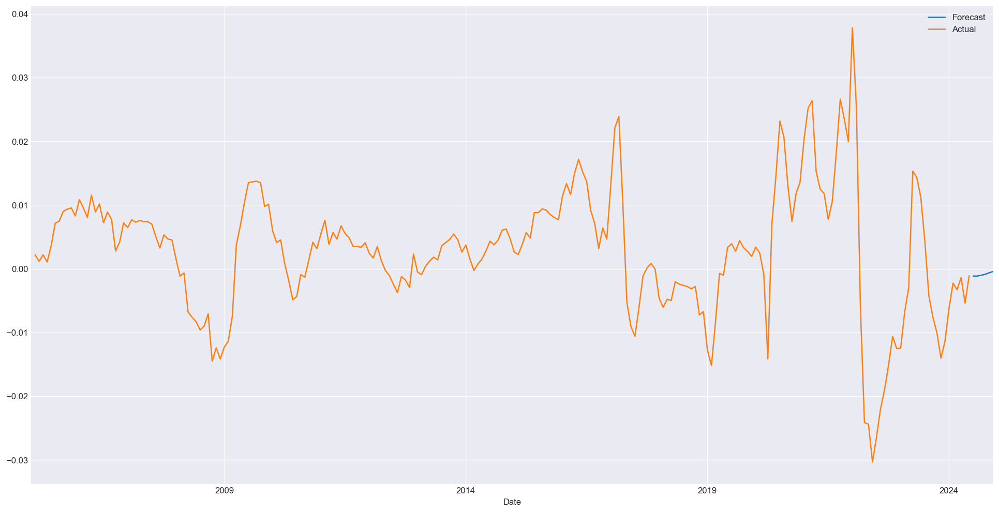

In [11]:
forecast3 = predict(df_cov, target,  ["Mortgage rate 5y growth12 lag 6", "M2 growth12 real lag 6"], 6, 1, LR)

show_forecast(df["HPI real"], forecast3)
show_forecast(df["HPI growth1 real"], forecast3, False)

# Custom Plots

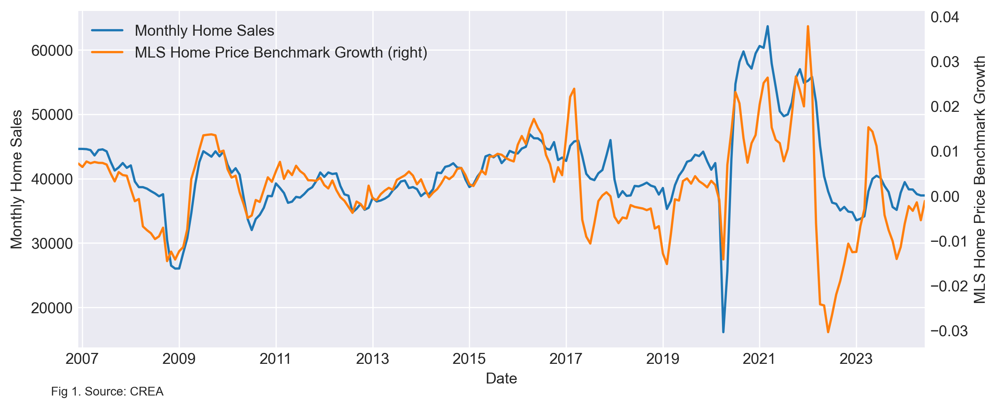

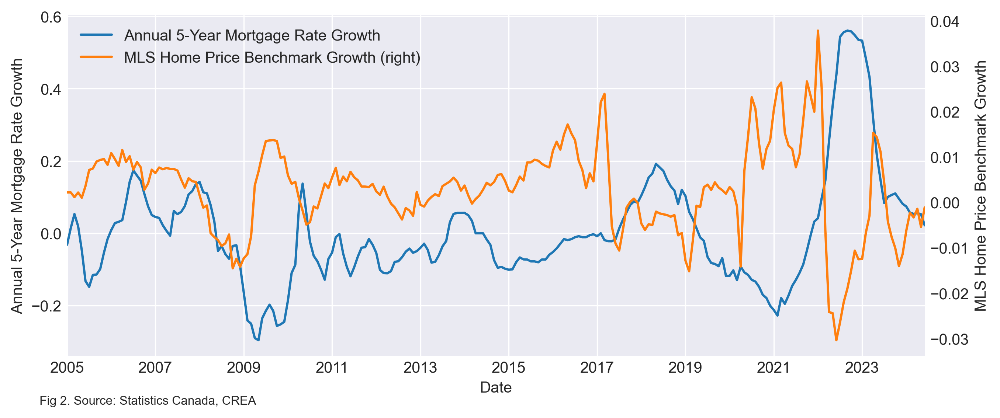

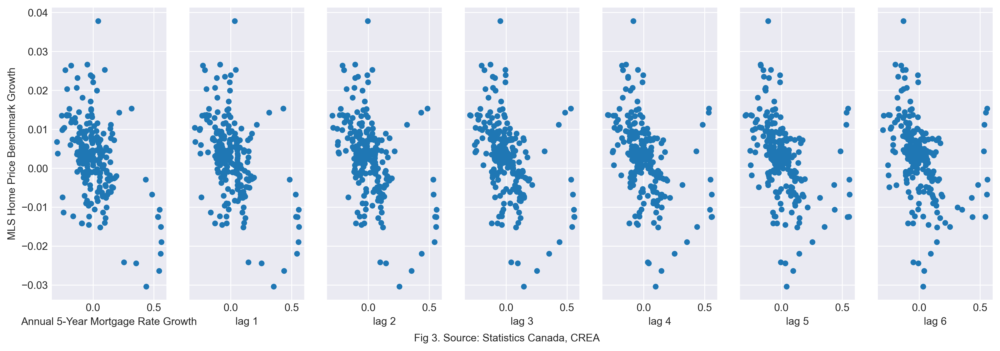

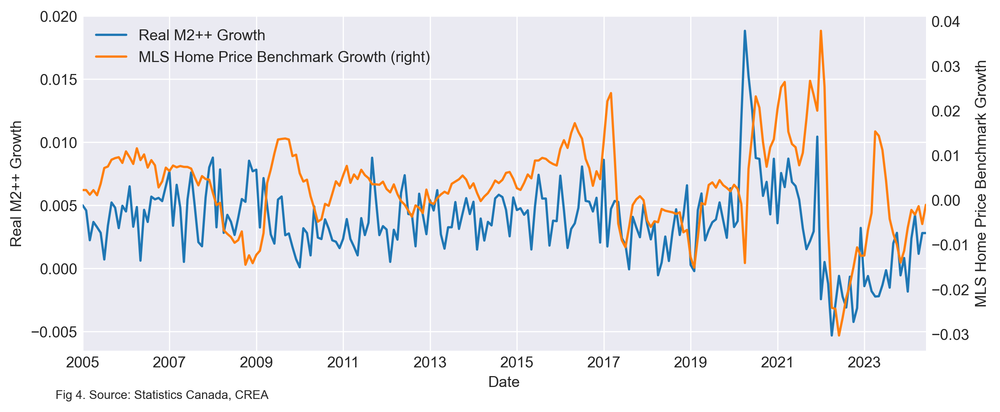

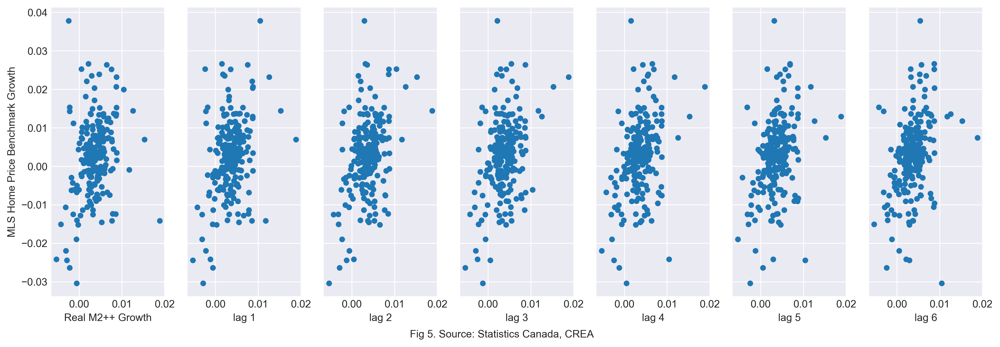

In [12]:
# ["Mortgage rate 5y_growth12_lag_6", "M2++_growth12_real_lag_6"]
plt.rcParams.update({'figure.figsize':(10,4), 'figure.dpi':300})

fig, ax = plt.subplots()
df_cov["Sales"][pd.Timestamp("20061225"):].plot(label="Monthly Home Sales", ylabel="Monthly Home Sales", ax=ax, legend="left")
df_cov[target][pd.Timestamp("20061225"):].plot(secondary_y=True, label="MLS Home Price Benchmark Growth", ylabel="MLS Home Price Benchmark Growth", ax=ax, legend="left")
plt.figtext(0.1, 0, "Fig 1. Source: CREA", wrap=True, fontsize=8)
plt.savefig("plots/sales.png")

fig, ax = plt.subplots()
df_cov["Mortgage rate 5y growth12"].plot(label="Annual 5-Year Mortgage Rate Growth", ylabel="Annual 5-Year Mortgage Rate Growth", ax=ax, legend="left")
df_cov[target].plot(secondary_y=True, label="MLS Home Price Benchmark Growth", ylabel="MLS Home Price Benchmark Growth", ax=ax, legend="left")
plt.figtext(0.1, 0, "Fig 2. Source: Statistics Canada, CREA", wrap=True, fontsize=8)
plt.savefig("plots/rates_ts.png")


feature = "Mortgage rate 5y growth12"
fig, ax = plt.subplots(1, 7, sharey="row",  figsize=(16,5))
for j in range(7):
    col_name  = feature if j==0 else feature + " lag " + str(j)
    if col_name in df_cov.columns:
        df_cov.plot.scatter(col_name, target, ax=ax[j])
        ax[j].set_xlabel("Annual 5-Year Mortgage Rate Growth" if j==0 else "lag " + str(j))
        ax[j].set_ylabel("MLS Home Price Benchmark Growth")
plt.figtext(0.5, 0, "Fig 3. Source: Statistics Canada, CREA", wrap=True, horizontalalignment='center',  fontsize=10)
plt.savefig("plots/rates_scatter.png")

fig, ax = plt.subplots()
df_cov["M2++ growth1 real"].plot(label="Real M2++ Growth", ylabel="Real M2++ Growth", ax=ax, legend="left")
df_cov[target].plot(secondary_y=True, label="MLS Home Price Benchmark Growth", ylabel="MLS Home Price Benchmark Growth", ax=ax, legend="left")
plt.figtext(0.1, 0, "Fig 4. Source: Statistics Canada, CREA", wrap=True, fontsize=8)
plt.savefig("plots/m2_ts.png")

feature = "M2++ growth1 real"
fig, ax = plt.subplots(1, 7, sharey="row", figsize=(16,5))
for j in range(7):
    col_name  = feature if j==0 else feature + " lag " + str(j)
    if col_name in df_cov.columns:
        df_cov.plot.scatter(col_name, target, ax=ax[j])
        ax[j].set_xlabel("Real M2++ Growth" if j==0 else "lag " + str(j))
        ax[j].set_ylabel("MLS Home Price Benchmark Growth")
plt.figtext(0.5, 0, "Fig 5. Source: Statistics Canada, CREA", wrap=True, horizontalalignment='center',  fontsize=10)
plt.savefig("plots/m2_scatter.png")


In [17]:
def extract_data_from_StatsCanada(file_path, in_col=None, out_cols=None, new_names=None, filters=None):
    """
    Extracts and processes data from a Statistics Canada CSV file.

    Parameters:
    - file_path (str): The name of the CSV file to read.
    - in_col (str, optional): Column to filter data by (e.g., a category column).
    - out_cols (list of str): List of columns to extract based on in_col filter.
    - new_names (list of str, optional): New names for the output columns.
    - filters (dict, optional): Additional filters to apply on the DataFrame.

    Returns:
    - pd.DataFrame: A DataFrame containing the processed and filtered data.
    """
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(['-'.join(x.split()[::-1]) for x in df['REF_DATE']])
    df.sort_values(by='Date', inplace=True)
    
    df_res = pd.DataFrame(index=df['Date'].drop_duplicates())

    for col in out_cols:
        df_ = df[df[in_col] == col] if in_col else df  # Filter based on in_col if provided
        
        if filters:
            for filter_key, filter_value in filters.items():
                df_ = df_[df_[filter_key] == filter_value]
        
        df_ = df_[["VALUE", "Date"]].set_index("Date")
        df_res = pd.concat([df_res, df_], axis=1)

    df_res.columns = new_names if new_names else out_cols
    return df_res

Index(['HPI', 'HPI_real', 'HPI_growth1_real'], dtype='object')


<Axes: xlabel='Date'>

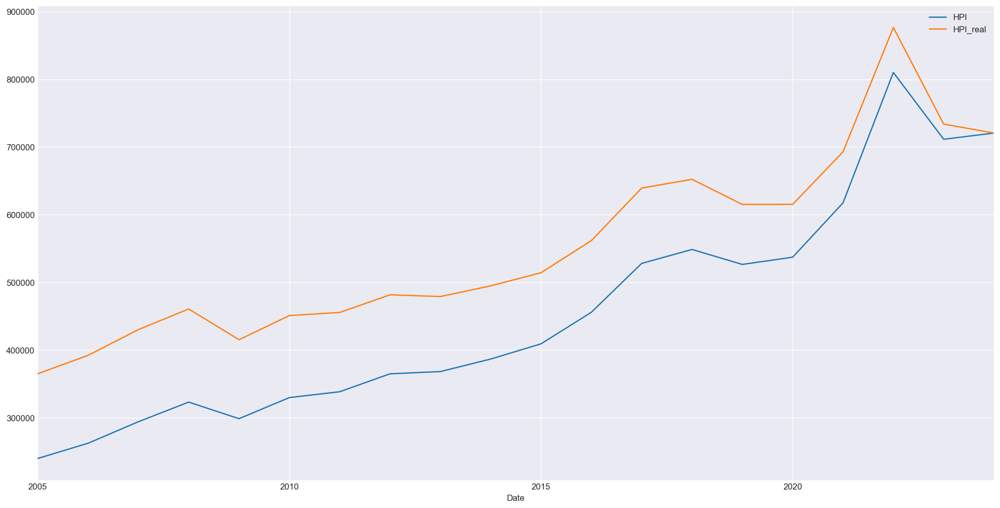

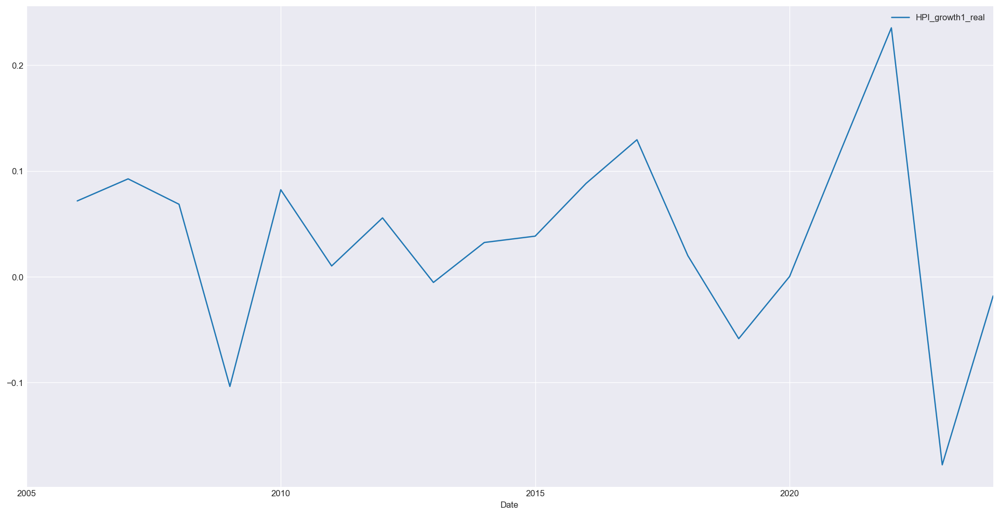

In [18]:
cpi = etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/1810025601_databaseLoadingData.csv', 
                    in_col = "Alternative measures",
                    out_cols = ["Measure of core inflation based on a weighted median approach, CPI-median (index, 198901=100)"],
                    new_names = ['CPI'],
                    num_lags = 0, freq='YS')

df = etl_pipeline(extract_data_from_CREA, file_path = f'{ROOT_PATH}/MLS_HPI/Seasonally Adjusted_June_2024.xlsx', sheet_name = 'AGGREGATE',
                in_col = "Composite_Benchmark_SA", new_names = ["HPI"],
                num_lags = 0, lagged_cols = ['HPI_growth1_real'],
                transform_dict = {"HPI": [infl_adjusted(cpi), compose(growth(1), infl_adjusted(cpi))]}, freq='YS')


print(df.columns)

target = "HPI_growth1_real" 
# df = df[target].dropna()
# df.plot()
df[['HPI','HPI_real']].plot()
plt.figure()
df[target].plot(legend="top")

In [19]:
def extract_data_from_StatsCanada(file_path, in_col=None, out_cols=None, new_names=None, filters=None):
    """
    Extracts and processes data from a Statistics Canada CSV file.

    Parameters:
    - file_path (str): The name of the CSV file to read.
    - in_col (str, optional): Column to filter data by (e.g., a category column).
    - out_cols (list of str): List of columns to extract based on in_col filter.
    - new_names (list of str, optional): New names for the output columns.
    - filters (dict, optional): Additional filters to apply on the DataFrame.

    Returns:
    - pd.DataFrame: A DataFrame containing the processed and filtered data.
    """
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(df['REF_DATE'], format='%Y')
    df.sort_values(by='Date', inplace=True)
    
    df_res = pd.DataFrame(index=df['Date'].drop_duplicates())

    for col in out_cols:
        df_ = df[df[in_col] == col] if in_col else df  # Filter based on in_col if provided
        
        if filters:
            for filter_key, filter_value in filters.items():
                df_ = df_[df_[filter_key] == filter_value]
        
        df_ = df_[["VALUE", "Date"]].set_index("Date")
        df_res = pd.concat([df_res, df_], axis=1)

    df_res.columns = new_names if new_names else out_cols
    return df_res

In [28]:
df_t = df.join(etl_pipeline(extract_data_from_StatsCanada, file_path = f'{ROOT_PATH}/3610000901_databaseLoadingData.csv', 
                    in_col = "North American Industry Classification System (NAICS)",
                    out_cols = ["Real estate and rental and leasing [53]"],
                    new_names = ['Foreign Investment'],
                    filters = {"Canadian and foreign direct investment": "Foreign direct investment in Canada - total book value"},
                    num_lags = 3, freq='YS', 
                    transform_dict = {"Foreign Investment": [compose(diff(1), infl_adjusted(cpi)), compose(growth(1), infl_adjusted(cpi))]}))

In [29]:
df_t = df_t.dropna()
df_t

,HPI,HPI_real,HPI_growth1_real,Foreign Investment,Foreign Investment_diff1_real,Foreign Investment_growth1_real,Foreign Investment_lag_1,Foreign Investment_lag_2,Foreign Investment_lag_3,Foreign Investment_diff1_real_lag_1,Foreign Investment_diff1_real_lag_2,Foreign Investment_diff1_real_lag_3,Foreign Investment_growth1_real_lag_1,Foreign Investment_growth1_real_lag_2,Foreign Investment_growth1_real_lag_3
Date,,,,,,,,,,,,,,,
2006-01-01,262300,392140.370899,0.071691,6538.0,2633.952857,0.313993,4691.0,4572.0,4694.0,52.451114,-320.649747,-175.692975,0.007373,-0.044245,-0.023438
2007-01-01,294100,430169.993022,0.092561,5190.0,-2183.121462,-0.252768,6538.0,4691.0,4572.0,2633.952857,52.451114,-320.649747,0.313993,0.007373,-0.044245
2008-01-01,323100,460692.244898,0.068550,5189.0,-192.497756,-0.025685,5190.0,6538.0,4691.0,-2183.121462,2633.952857,52.451114,-0.252768,0.313993,0.007373
2009-01-01,298600,415305.640345,-0.103716,5651.0,460.914874,0.060433,5189.0,5190.0,6538.0,-192.497756,-2183.121462,2633.952857,-0.025685,-0.252768,0.313993
2010-01-01,329800,450920.287019,0.082276,5015.0,-1002.874729,-0.136505,5651.0,5189.0,5190.0,460.914874,-192.497756,-2183.121462,0.060433,-0.025685,-0.252768
2011-01-01,338400,455546.820809,0.010208,4650.0,-597.047310,-0.091100,5015.0,5651.0,5189.0,-1002.874729,460.914874,-192.497756,-0.136505,0.060433,-0.025685
2012-01-01,364900,481631.234257,0.055680,4056.0,-906.218915,-0.156384,4650.0,5015.0,5651.0,-597.047310,-1002.874729,460.914874,-0.091100,-0.136505,0.060433
2013-01-01,368200,479048.541279,-0.005377,4455.0,442.689782,0.079450,4056.0,4650.0,5015.0,-906.218915,-597.047310,-1002.874729,-0.156384,-0.091100,-0.136505
2014-01-01,386700,494824.908425,0.032402,7186.0,3399.071166,0.461487,4455.0,4056.0,4650.0,442.689782,-906.218915,-597.047310,0.079450,-0.156384,-0.091100


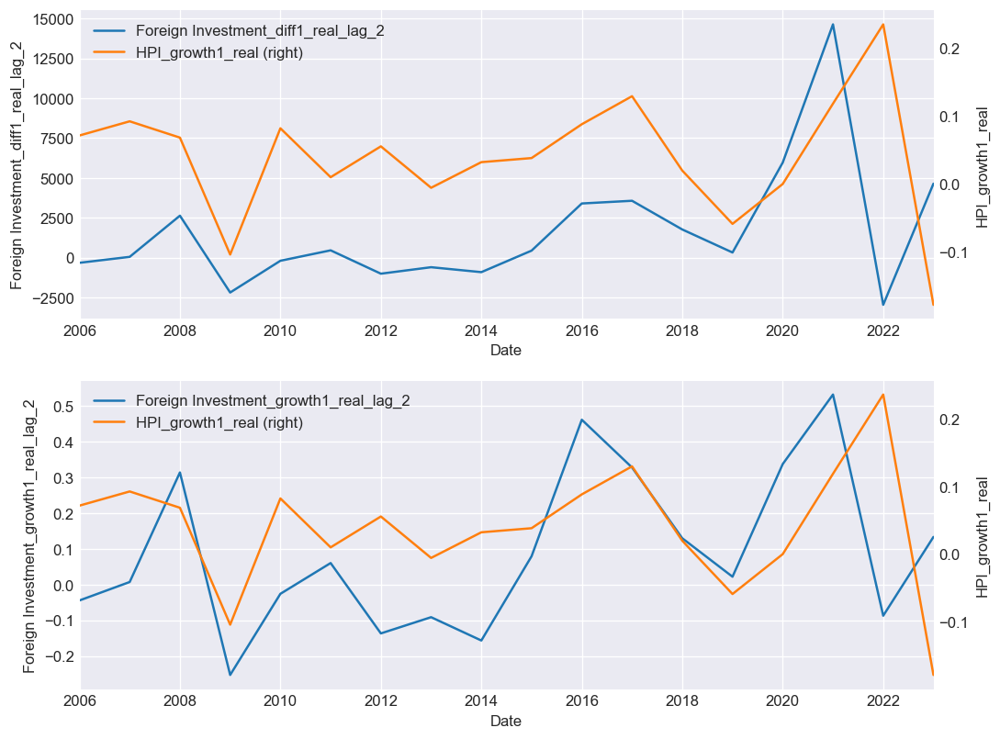

In [30]:
plot_covariates(df_t, target, ["Foreign Investment_diff1_real_lag_2", "Foreign Investment_growth1_real_lag_2"])

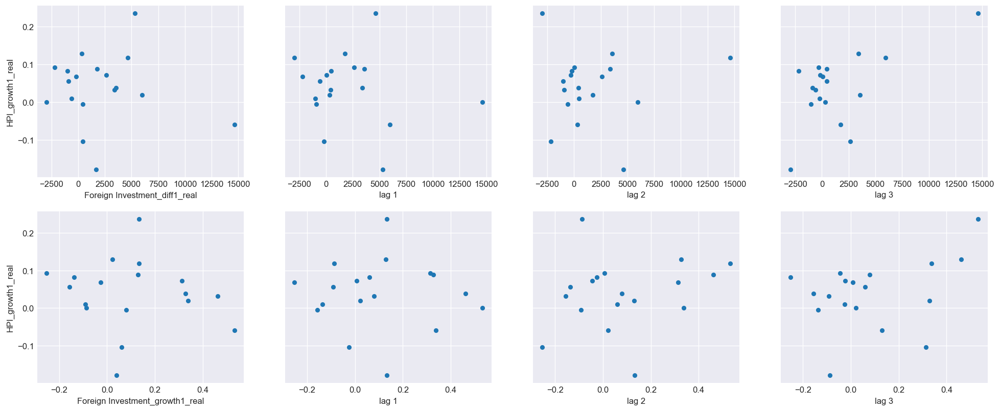

In [31]:
plot_target_covariates(df_t, 4, target, ["Foreign Investment_diff1_real", "Foreign Investment_growth1_real"])

In [32]:
sm_est = sm.OLS(df_t[target], sm.add_constant(df_t["Foreign Investment_growth1_real_lag_3"]))
sm_est2 = sm_est.fit()
print(sm_est2.summary())

                            OLS Regression Results                            
Dep. Variable:       HPI_growth1_real   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     2.389
Date:                Wed, 21 Aug 2024   Prob (F-statistic):              0.142
Time:                        21:55:07   Log-Likelihood:                 19.162
No. Observations:                  18   AIC:                            -34.32
Df Residuals:                      16   BIC:                            -32.54
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

/Users/andreypak/opt/miniconda3/envs/hpi/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=18
  res = hypotest_fun_out(*samples, **kwds)
